<a href="https://colab.research.google.com/github/makhijakabir/randomML/blob/main/cancerMortalityPerCapita.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Predict the cancer mortality rate per capita (100000) using several demographic variables.

##This notebook has been created as an assignment for LET THE DATA CONFESS.

##Imports and Constants

In [45]:
import pandas_profiling as pf
from sklearn.model_selection import train_test_split
from sklearn import metrics
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.formula.api as smf

%matplotlib inline 

In [9]:
data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/randomDataset/cancer_reg.csv", encoding = "ISO-8859-1")

##Data Exploration

In [10]:
data

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,MedianAgeMale,MedianAgeFemale,Geography,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.000000,469,164.9,489.800000,61898,260131,11.2,499.748204,"(61494.5, 125635]",39.3,36.9,41.7,"Kitsap County, Washington",2.54,52.5,11.5,39.5,42.1,6.9,23.2,19.6,51.9,8.0,75.1,NaN,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.000000,70,161.3,411.600000,48127,43269,18.6,23.111234,"(48021.6, 51046.4]",33.0,32.2,33.7,"Kittitas County, Washington",2.34,44.5,6.1,22.4,64.0,7.5,26.0,22.7,55.9,7.8,70.2,53.8,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.000000,50,174.7,349.700000,49348,21026,14.6,47.560164,"(48021.6, 51046.4]",45.0,44.0,45.8,"Klickitat County, Washington",2.62,54.2,24.0,36.6,NaN,9.5,29.0,16.0,45.9,7.0,63.7,43.5,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.000000,202,194.8,430.400000,44243,75882,17.1,342.637253,"(42724.4, 45201]",42.8,42.2,43.4,"Lewis County, Washington",2.52,52.7,20.2,41.2,36.1,2.5,31.6,9.3,48.3,12.1,58.4,40.3,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.000000,26,144.4,350.100000,49955,10321,12.5,0.000000,"(48021.6, 51046.4]",48.3,47.8,48.9,"Lincoln County, Washington",2.34,57.8,14.9,43.0,40.0,2.0,33.4,15.0,48.2,4.8,61.6,43.9,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3042,1962.667684,15,149.6,453.549422,46961,6343,12.4,0.000000,"(45201, 48021.6]",44.2,41.1,48.8,"Ellsworth County, Kansas",2.08,51.0,20.9,27.9,NaN,8.4,32.2,15.2,51.7,4.3,78.3,54.9,44.6,31.7,13.2,90.280811,3.837754,0.327613,1.700468,51.063830,7.773512
3043,1962.667684,43,150.1,453.549422,48609,37118,18.8,377.175494,"(48021.6, 51046.4]",30.4,29.3,31.4,"Finney County, Kansas",2.90,52.6,26.7,33.9,35.6,3.8,23.1,12.4,70.1,4.6,64.5,53.3,48.6,28.8,17.7,75.706245,2.326771,4.044920,14.130288,52.007937,8.186470
3044,1962.667684,46,153.9,453.549422,51144,34536,15.0,1968.959926,"(51046.4, 54545.6]",30.9,30.5,31.2,"Ford County, Kansas",3.04,54.8,19.7,44.5,33.3,2.5,23.0,12.8,64.8,6.4,62.0,52.6,47.8,26.6,16.8,87.961629,2.313188,1.316472,5.680705,55.153949,7.809192
3045,1962.667684,52,175.0,453.549422,50745,25609,13.3,0.000000,"(48021.6, 51046.4]",39.0,36.9,40.5,"Franklin County, Kansas",2.56,58.8,10.9,37.2,NaN,4.1,36.1,14.4,NaN,6.9,75.9,56.3,49.6,29.5,14.0,92.905681,1.176562,0.244632,2.131790,58.484232,7.582938


In [11]:
data.count()

avgAnnCount                3047
avgDeathsPerYear           3047
TARGET_deathRate           3047
incidenceRate              3047
medIncome                  3047
popEst2015                 3047
povertyPercent             3047
studyPerCap                3047
binnedInc                  3047
MedianAge                  3047
MedianAgeMale              3047
MedianAgeFemale            3047
Geography                  3047
AvgHouseholdSize           3047
PercentMarried             3047
PctNoHS18_24               3047
PctHS18_24                 3047
PctSomeCol18_24             762
PctBachDeg18_24            3047
PctHS25_Over               3047
PctBachDeg25_Over          3047
PctEmployed16_Over         2895
PctUnemployed16_Over       3047
PctPrivateCoverage         3047
PctPrivateCoverageAlone    2438
PctEmpPrivCoverage         3047
PctPublicCoverage          3047
PctPublicCoverageAlone     3047
PctWhite                   3047
PctBlack                   3047
PctAsian                   3047
PctOther

In [12]:
data.describe()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctSomeCol18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
count,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3.047000e+03,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,762.000000,3047.000000,3047.000000,3047.000000,2895.000000,3047.000000,3047.000000,2438.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000
mean,606.338544,185.965868,178.664063,448.268586,47063.281917,1.026374e+05,16.878175,155.399415,45.272333,39.570725,42.145323,2.479662,51.773679,18.224450,35.002068,40.977034,6.158287,34.804660,13.282015,54.152642,7.852412,64.354939,48.453774,41.196324,36.252642,19.240072,83.645286,9.107978,1.253965,1.983523,51.243872,5.640306
std,1416.356223,504.134286,27.751511,54.560733,12040.090836,3.290592e+05,6.409087,529.628366,45.304480,5.226017,5.292849,0.429174,6.896928,8.093064,9.069722,11.115805,4.529059,7.034924,5.394756,8.315064,3.452371,10.647057,10.083006,9.447687,7.841741,6.113041,16.380025,14.534538,2.610276,3.517710,6.572814,1.985816
min,6.000000,3.000000,59.700000,201.300000,22640.000000,8.270000e+02,3.200000,0.000000,22.300000,22.400000,22.300000,0.022100,23.100000,0.000000,0.000000,7.100000,0.000000,7.500000,2.500000,17.600000,0.400000,22.300000,15.700000,13.500000,11.200000,2.600000,10.199155,0.000000,0.000000,0.000000,22.992490,0.000000
25%,76.000000,28.000000,161.200000,420.300000,38882.500000,1.168400e+04,12.150000,0.000000,37.700000,36.350000,39.100000,2.370000,47.750000,12.800000,29.200000,34.000000,3.100000,30.400000,9.400000,48.600000,5.500000,57.200000,41.000000,34.500000,30.900000,14.850000,77.296180,0.620675,0.254199,0.295172,47.763063,4.521419
50%,171.000000,61.000000,178.100000,453.549422,45207.000000,2.664300e+04,15.900000,0.000000,41.000000,39.600000,42.400000,2.500000,52.400000,17.100000,34.700000,40.400000,5.400000,35.300000,12.300000,54.500000,7.600000,65.100000,48.700000,41.100000,36.300000,18.800000,90.059774,2.247576,0.549812,0.826185,51.669941,5.381478
75%,518.000000,149.000000,195.200000,480.850000,52492.000000,6.867100e+04,20.400000,83.650776,44.000000,42.500000,45.300000,2.630000,56.400000,22.700000,40.700000,46.400000,8.200000,39.650000,16.100000,60.300000,9.700000,72.100000,55.600000,47.700000,41.550000,23.100000,95.451693,10.509732,1.221037,2.177960,55.395132,6.493677
max,38150.000000,14010.000000,362.800000,1206.900000,125635.000000,1.017029e+07,47.400000,9762.308998,624.000000,64.700000,65.700000,3.970000,72.500000,64.100000,72.500000,79.000000,51.800000,54.800000,42.200000,80.100000,29.400000,92.300000,78.900000,70.700000,65.100000,46.600000,100.000000,85.947799,42.619425,41.930251,78.075397,21.326165


##Data Visualization

In [15]:
#This checks for null values in the data (if any)

data.isnull().sum()

avgAnnCount                   0
avgDeathsPerYear              0
TARGET_deathRate              0
incidenceRate                 0
medIncome                     0
popEst2015                    0
povertyPercent                0
studyPerCap                   0
binnedInc                     0
MedianAge                     0
MedianAgeMale                 0
MedianAgeFemale               0
Geography                     0
AvgHouseholdSize              0
PercentMarried                0
PctNoHS18_24                  0
PctHS18_24                    0
PctSomeCol18_24            2285
PctBachDeg18_24               0
PctHS25_Over                  0
PctBachDeg25_Over             0
PctEmployed16_Over          152
PctUnemployed16_Over          0
PctPrivateCoverage            0
PctPrivateCoverageAlone     609
PctEmpPrivCoverage            0
PctPublicCoverage             0
PctPublicCoverageAlone        0
PctWhite                      0
PctBlack                      0
PctAsian                      0
PctOther

In [16]:
data.columns[data.isna().any()].tolist()

['PctSomeCol18_24', 'PctEmployed16_Over', 'PctPrivateCoverageAlone']

###pctsomecol18_24 - Percent of county residents ages 18-24 highest education attained: some college 
###pctemployed16_over - Percent of county residents ages 16 and over employed 
###pctprivatecoveragealone - Percent of county residents with private health coverage alone (no public assistance) 

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


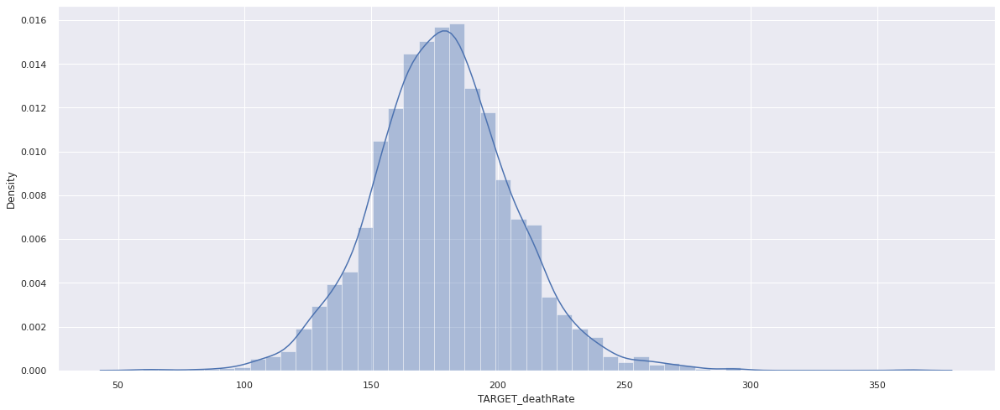

In [21]:
sns.set(rc = {'figure.figsize':(20,8)})
sns.distplot(data['TARGET_deathRate'])
plt.show()

###The Target Death Rate follows a normal distribution since it represents a Bell Curve

###Removing columns with more than 20% NA values

In [24]:
data = data.drop(['PctSomeCol18_24'],axis=1)
data = data.drop(['avgDeathsPerYear'],axis=1)

##Checking for Correlation

In [38]:
data.corr()

,avgAnnCount,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,MedianAgeFemale,AvgHouseholdSize,PercentMarried,PctNoHS18_24,PctHS18_24,PctBachDeg18_24,PctHS25_Over,PctBachDeg25_Over,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverage,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
avgAnnCount,1.000000,-0.143532,0.073553,0.269145,0.926894,-0.135694,0.082071,-0.024098,-0.124969,-0.122844,0.064788,-0.106108,-0.143327,-0.182054,0.284176,-0.311375,0.321021,0.197981,-0.009016,0.132244,0.186045,0.202349,-0.173548,-0.093699,-0.136501,0.031376,0.435071,0.209184,-0.106221,-0.034508
TARGET_deathRate,-0.143532,1.000000,0.449432,-0.428615,-0.120073,0.429389,-0.022285,0.004375,-0.021929,0.012048,-0.036905,-0.266820,0.088463,0.261976,-0.287817,0.404589,-0.485477,-0.397487,0.378412,-0.386066,-0.363704,-0.267399,0.404572,0.449358,-0.177400,0.257024,-0.186331,-0.189894,-0.293325,-0.087407
incidenceRate,0.073553,0.449432,1.000000,-0.001036,0.026912,0.009046,0.077283,0.018089,-0.014733,-0.009106,-0.118400,-0.119524,-0.170762,0.022644,0.046835,0.121725,-0.038177,0.004622,0.099979,0.105174,0.109278,0.149825,0.046109,0.040812,-0.014510,0.113489,-0.008123,-0.208748,-0.152176,-0.118181
medIncome,0.269145,-0.428615,-0.001036,1.000000,0.235523,-0.788965,0.044003,-0.013288,-0.091663,-0.153278,0.112065,0.355123,-0.289383,-0.190006,0.492810,-0.471348,0.704928,0.676307,-0.453108,0.724175,0.788048,0.747294,-0.754822,-0.719756,0.167225,-0.270232,0.425844,0.083635,0.446083,-0.010195
popEst2015,0.926894,-0.120073,0.026912,0.235523,1.000000,-0.065299,0.055722,-0.025219,-0.176608,-0.177932,0.109940,-0.160463,-0.126582,-0.151821,0.248375,-0.311849,0.297463,0.139571,0.050768,0.052677,0.132660,0.158650,-0.160066,-0.041469,-0.190095,0.073044,0.464168,0.241468,-0.127979,-0.057740
povertyPercent,-0.135694,0.429389,0.009046,-0.788965,-0.065299,1.000000,-0.055652,-0.029280,-0.214001,-0.148164,0.074308,-0.642857,0.288106,0.094211,-0.387122,0.194361,-0.531600,-0.719972,0.655148,-0.822534,-0.761672,-0.683100,0.651162,0.798642,-0.509433,0.511530,-0.157289,0.047096,-0.604953,-0.012283
studyPerCap,0.082071,-0.022285,0.077283,0.044003,0.055722,-0.055652,1.000000,-0.026030,-0.036647,-0.030577,-0.004071,-0.038143,-0.090387,-0.057035,0.063819,-0.085128,0.108594,0.087669,-0.031957,0.092545,0.072381,0.100063,-0.051497,-0.055512,0.023291,-0.019761,0.062543,-0.015247,-0.051736,0.010676
MedianAge,-0.024098,0.004375,0.018089,-0.013288,-0.025219,-0.029280,-0.026030,1.000000,0.129119,0.124678,-0.031944,0.046372,0.006178,0.050574,-0.016909,0.036587,-0.020352,-0.023598,0.018590,0.004665,-0.024272,-0.036926,0.049060,-0.003298,0.035009,-0.017173,-0.038424,-0.030277,0.014504,-0.008276
MedianAgeMale,-0.124969,-0.021929,-0.014733,-0.091663,-0.176608,-0.214001,-0.036647,0.129119,1.000000,0.933696,-0.343189,0.449986,0.100486,0.241310,-0.034135,0.318277,-0.131599,-0.161204,-0.142737,0.082232,-0.167064,-0.208664,0.398967,0.002479,0.398044,-0.242748,-0.238322,-0.266655,0.222278,-0.104105
MedianAgeFemale,-0.122844,0.012048,-0.009106,-0.153278,-0.177932,-0.148164,-0.030577,0.124678,0.933696,1.000000,-0.367585,0.375208,0.136361,0.242827,-0.070699,0.344840,-0.180845,-0.243469,-0.111161,0.046909,-0.209402,-0.252221,0.455496,0.047659,0.339804,-0.156728,-0.258748,-0.274120,0.161507,-0.098813


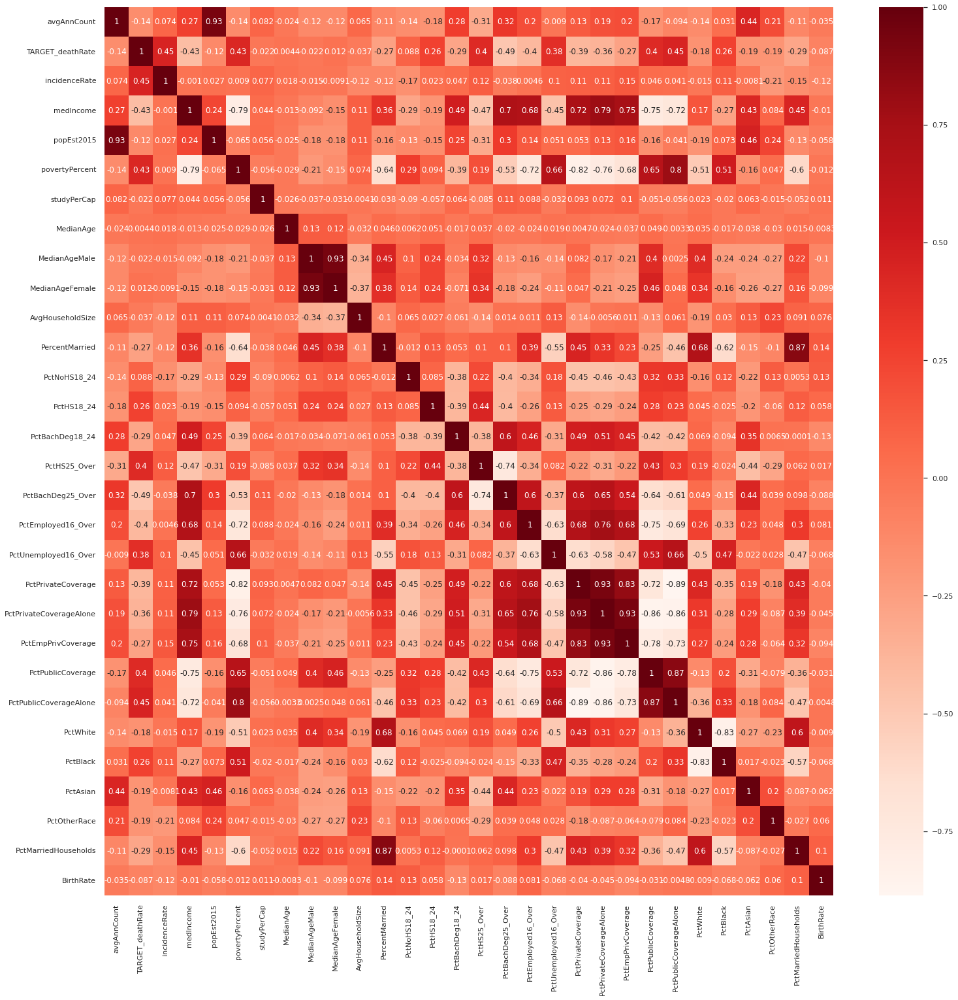

In [27]:
sns.set(rc={'figure.figsize':(25,25)})
sns.heatmap(data.corr(), annot=True, cmap='Reds')

###Subsetting the columns by removing highly correlated variables

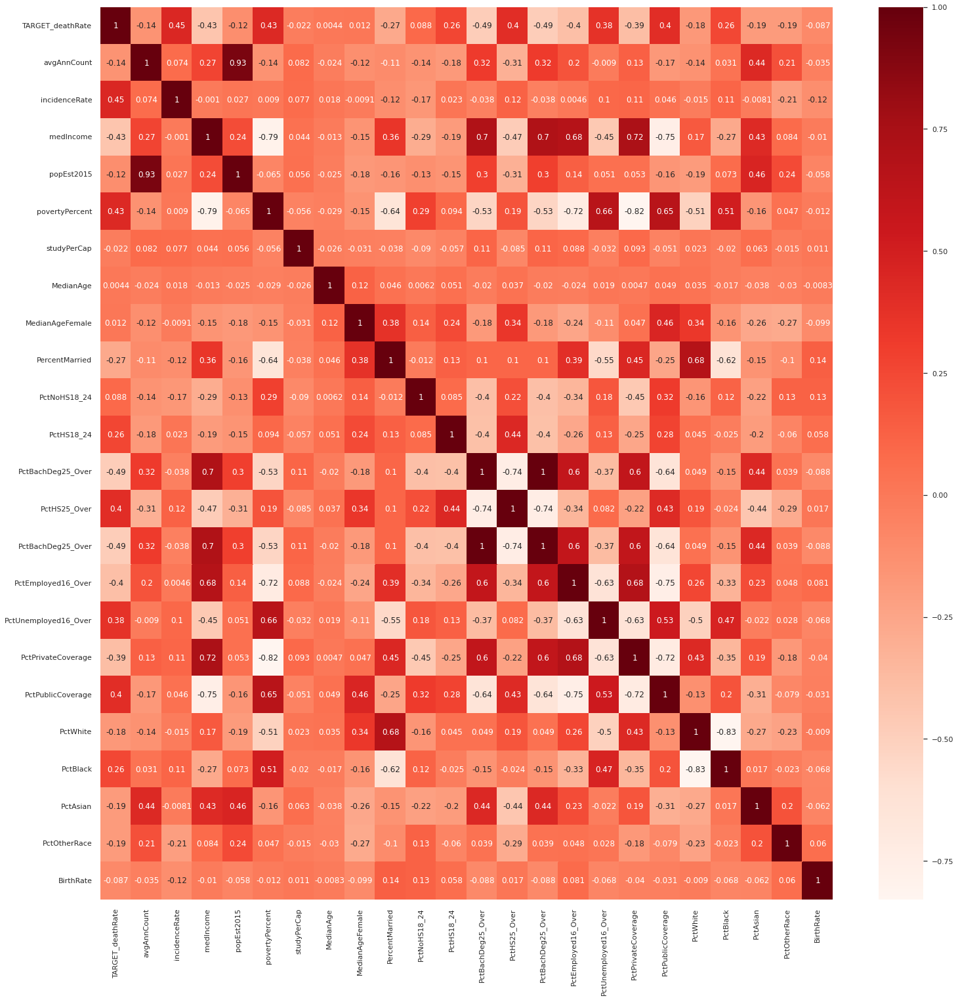

In [30]:
new_feature = ['TARGET_deathRate','avgAnnCount', 'incidenceRate', 'medIncome', 'popEst2015', 'povertyPercent', 'studyPerCap', 'MedianAge', 'MedianAgeFemale',
       'PercentMarried', 'PctNoHS18_24', 'PctHS18_24', 'PctBachDeg25_Over', 'PctHS25_Over', 'PctBachDeg25_Over', 'PctEmployed16_Over', 'PctUnemployed16_Over', 'PctPrivateCoverage',
       'PctPublicCoverage', 'PctWhite', 'PctBlack', 'PctAsian', 'PctOtherRace', 'BirthRate']

sns.heatmap(data[new_feature].corr(), annot=True, cmap='Reds')

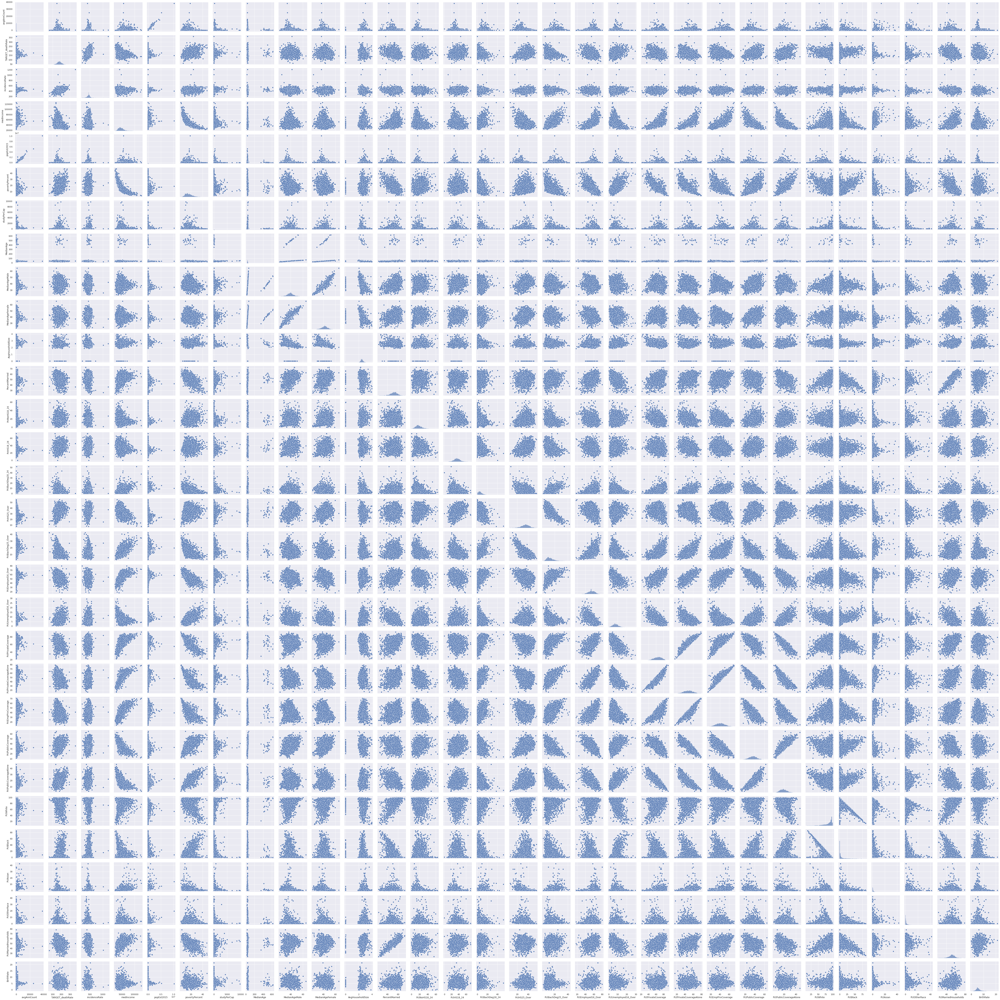

CPU times: user 11min, sys: 5.58 s, total: 11min 5s
Wall time: 11min 2s


In [39]:
%%time
sns.pairplot(data)
plt.show()

##Model Building

In [40]:
train, test = train_test_split(data[new_feature], test_size=0.2, random_state = 44) 

In [33]:
train.shape

(2437, 24)

In [34]:
test.shape

(610, 24)

In [35]:
train.columns

Index(['TARGET_deathRate', 'avgAnnCount', 'incidenceRate', 'medIncome',
       'popEst2015', 'povertyPercent', 'studyPerCap', 'MedianAge',
       'MedianAgeFemale', 'PercentMarried', 'PctNoHS18_24', 'PctHS18_24',
       'PctBachDeg25_Over', 'PctHS25_Over', 'PctBachDeg25_Over',
       'PctEmployed16_Over', 'PctUnemployed16_Over', 'PctPrivateCoverage',
       'PctPublicCoverage', 'PctWhite', 'PctBlack', 'PctAsian', 'PctOtherRace',
       'BirthRate'],
      dtype='object')

In [42]:
lm=smf.ols('TARGET_deathRate~avgAnnCount+incidenceRate+medIncome+popEst2015+povertyPercent+studyPerCap+MedianAge+MedianAgeFemale+PercentMarried+PctNoHS18_24+PctHS18_24+PctBachDeg25_Over+PctHS25_Over+PctBachDeg25_Over+PctEmployed16_Over+PctUnemployed16_Over+PctPrivateCoverage+PctPublicCoverage+PctWhite+PctBlack+PctAsian+PctOtherRace+BirthRate', train).fit()

In [43]:
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.505
Model:                            OLS   Adj. R-squared:                  0.500
Method:                 Least Squares   F-statistic:                     111.9
Date:                Tue, 07 Dec 2021   Prob (F-statistic):               0.00
Time:                        19:17:43   Log-Likelihood:                -10678.
No. Observations:                2437   AIC:                         2.140e+04
Df Residuals:                    2414   BIC:                         2.154e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept              126.3771 

In [44]:
pred = lm.predict(test)
pred.head(5)

2263    177.087832
1377    192.018546
2911    187.218897
692     182.142670
505     189.309965
dtype: float64

In [47]:
print('MAE:', metrics.mean_absolute_error(test.TARGET_deathRate, pred))
print('MSE:', metrics.mean_squared_error(test.TARGET_deathRate, pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test.TARGET_deathRate, pred)))

MAE: 14.818769481083505
MSE: 412.2611320681348
RMSE: 20.304214638053224
